In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import contextily as cx
import geopandas as gpd
from shapely.geometry import Point
import copy
import os
import tqdm
from collections import deque
import imageio
from tqdm import tqdm, trange

In [53]:
data = pd.read_csv(r"D:\Productivity\PythonProjects\Bicycle Cracker\Blue\240626\240626A.csv") # load IMU data; please change the path if needed
data.dtg = pd.to_datetime(data.dtg)  # convert raspberry pi timestamps from string to datetime  

In [54]:
def convert_utcs(data):
    '''
    this function converts the satellite timestamps from string to datetime and from utc to Eastern time
    '''
    eastern = [ ]
    for i in trange(len(data)):
        utc = data.timeutc.iloc[i].split(' ')
        utctime = datetime.strptime(utc[1], '%H:%M:%S') if len(utc)>1 else datetime.strptime('00:00:00', '%H:%M:%S')
        e = utctime + timedelta(days=1) - timedelta(hours=4)  
        eastern.append(e)
    easterntime = pd.Series(eastern).dt.time 
    easterndatetime = data.dtg.dt.date.astype(str) + ' '+ easterntime.astype(str)
    easterndatetime_ = pd.to_datetime(easterndatetime)
    return easterndatetime_

easterndatetime = convert_utcs(data) # call the satellite time conversion function
data['satellite'] = easterndatetime # put converted satellite time (EST) to the loaded dataframe

100%|████████████████████████████████████████████████████████████████████████| 80438/80438 [00:00<00:00, 101285.66it/s]


In [55]:
def plot_IMU(start, end, check=None, savetofile=None):
    '''
    this function generates a figure showing IMU data over time
    inputs:
        'start': datetime timestamp defining the video start time
        'end': datetime timestamp defining the video end time
        'check': datetime delta defining the second after the video start to be highlighted; default None
        'savetofile': the path to store the figure; default None
    '''
    data.plot(x='dtg', y=['acce_z','acce_x','acce_y'], color=['mediumslateblue','orangered','mediumseagreen'], linewidth=0.8)
    plt.ylim(-2,3)
    plt.xlim(start, end)
    plt.grid()
    if check is not None:
        plt.axvline(check, color='red', alpha=0.25, linewidth=7.5) # highlight a specific timestamp
    if savetofile is not None:
        plt.savefig(savetofile, dpi=200) # save the image to a local folder

In [56]:
def plot_gps(data, start=None, end=None):
    '''
    this function generates a GPS plot with background street map using geopandas
    inputs:
        'start': datetime timestamp from which GPS is plotted
        'end': datetime timestamp to end the plot
    '''
    _start = data.dtg.min() if start is None else start
    _end = data.dtg.min() if end is None else end
    _data = data[(data.dtg>_start)&(data.dtg<_end)]
    blue_gps = _data[(_data.latitude!=0)&(_data.longitude!=0)]  # invalid GPS data is ignored
    blue_geometry = [Point(xy) for xy in zip(blue_gps.longitude, blue_gps.latitude)]  # create geometry information for GPS points
    blue_gdf = gpd.GeoDataFrame(blue_gps, crs="EPSG:4326", geometry=blue_geometry) # attach geometry information to dataset
    fig, ax = plt.subplots(figsize = (30, 30))
    s1 = blue_gdf.to_crs('EPSG:3857').plot(ax=ax,markersize=50,column='acce_z',legend=False, categorical=False, color='blue')
    ax = plt.gca()
    cx.add_basemap(s1)

In [85]:
def animate_gps(data, start, end, interval=1, maxlen=50, folder='./Gifs', gifname='gps'):
    '''
    this function generates a gif to animate GPS; 
    inputs:
        'start': datetime timestamp from which GPS is plotted
        'end': datetime timestamp to end the plot
        'interval': the interval in seconds between two frames
        'maxlen': the maximum number of GPS points can be shown in a single frame
        'folder': the folder to temporarily store the figures and to store the gif; if the path does not exist, it will be created
        'gifname': the name of the output gif file
    '''
    blue = data[(data.dtg>start)&(data.dtg<end)]
    blue_gps = blue[(blue.latitude!=0)&(blue.longitude!=0)]
    blue_geometry = [Point(xy) for xy in zip(blue_gps.longitude, blue_gps.latitude)]
    blue_gdf = gpd.GeoDataFrame(blue_gps, crs="EPSG:4326", geometry=blue_geometry)
    blue_gdf_proj = blue_gdf.to_crs('EPSG:3857')
    _data = blue_gdf_proj
    if not os.path.exists(folder):
        os.makedirs(folder)
    pathList = []
    # readings = gpd.GeoDataFrame([], columns=data.columns)
    # before the crash happens
    _ilocs = deque([], maxlen=maxlen)
    _start = start.round('s')
    _end = end.round('s')
    trange = pd.date_range(_start, _end, freq=pd.Timedelta(seconds=interval))
    for frame in tqdm(trange):
        fig, ax = plt.subplots()
        _ilocs.append((_data['dtg']-frame).abs().argsort().iloc[0])
        title = str(frame)
        ax.set_title(title, loc='right')
        readings = _data.iloc[_ilocs]
        print (title)
        so = _data.plot(ax=ax,markersize=10, categorical=False, color='red', marker='o', alpha=0)
        l = len(readings)
        s1 = readings.plot(ax=ax, markersize=10, categorical=False, color='red', marker='o', alpha=np.arange( max(0,1-l/maxlen),1,1/maxlen))
        cx.add_basemap(so)
        'path to the saved images'
        path = f"{folder}/{title.replace(':','-')}.png"
        pathList.append(path)
        # ax.set_xlim(xlim)
        # ax.set_ylim(ylim)
        plt.axis('off')
        plt.savefig(path,dpi=300)
        plt.show() 
    with imageio.get_writer(f"{folder}\{gifname}.gif", mode='I', duration = 0.2) as writer:
        for filename in pathList:
            image = imageio.imread(filename)
            writer.append_data(image)
    plt.show()

In [57]:
start = pd.to_datetime('2024-06-26 11:19:16')  # please use video start time here 
end = pd.to_datetime('2024-06-26 11:26:56')  # please use video end time here 

In [58]:
check = start+pd.Timedelta(minutes=6, seconds=33) # enter a timestep to check, e.g., minutes=6, seconds=33 represents 6 minutes 33 seconds after the video starts

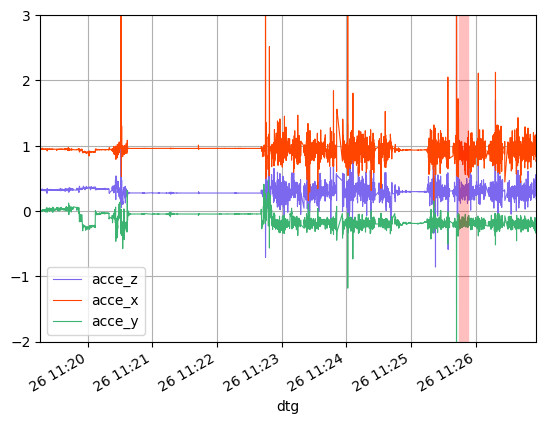

In [59]:
plot_IMU(start, end, check) # call plot_IMU to plot accelerometer data with a highlighted timestep

d:\productivity\anaconda\lib\site-packages\geopandas\plotting.py:658: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


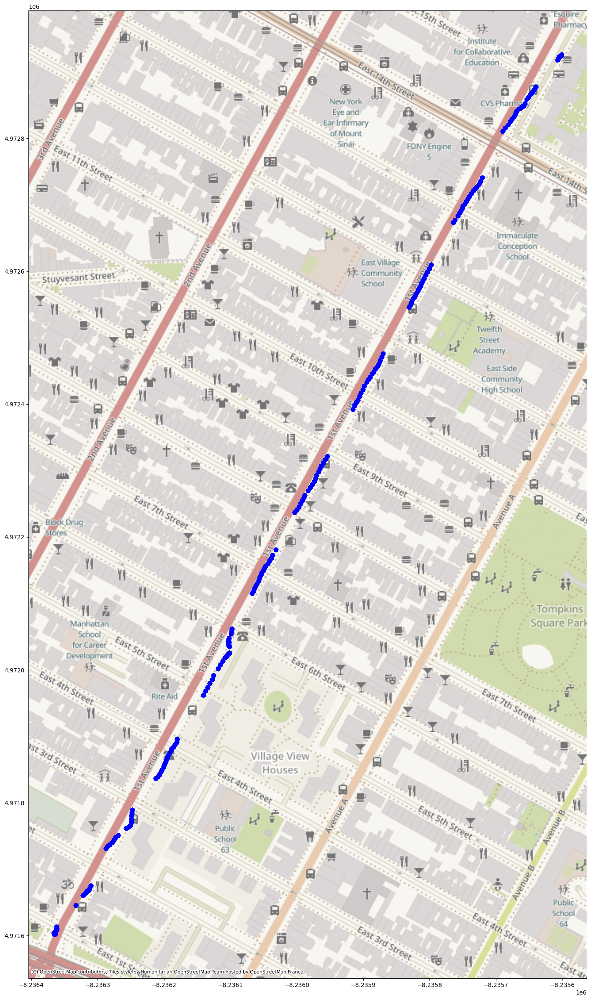

In [69]:
plot_gps(data, start, end) # call plot_gps function to generate a GPS plot; please notice drifting can happen

  0%|                                                                                          | 0/461 [00:00<?, ?it/s]

2024-06-26 11:19:16
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297   -73.9885   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   

         acce_x    acce_y    acce_z           satellite  \
55737  0.950195  0.009277  0.313477 2024-06-26 11:19:01   

                               geometry  
55737  POINT (-8236362.182 4971613.357)  


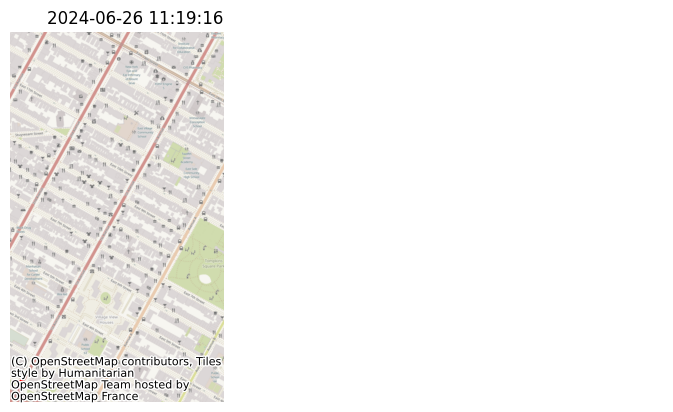

  0%|▏                                                                                 | 1/461 [00:00<03:30,  2.18it/s]

2024-06-26 11:19:17
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297   -73.9885   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297   -73.9885   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   

         acce_x    acce_y    acce_z           satellite  \
55737  0.950195  0.009277  0.313477 2024-06-26 11:19:01   
55744  0.946777  0.003906  0.317871 2024-06-26 11:19:01   

                               geometry  
55737  POINT (-8236362.182 4971613.357)  
55744  POINT (-8236362.182 4971613.357)  


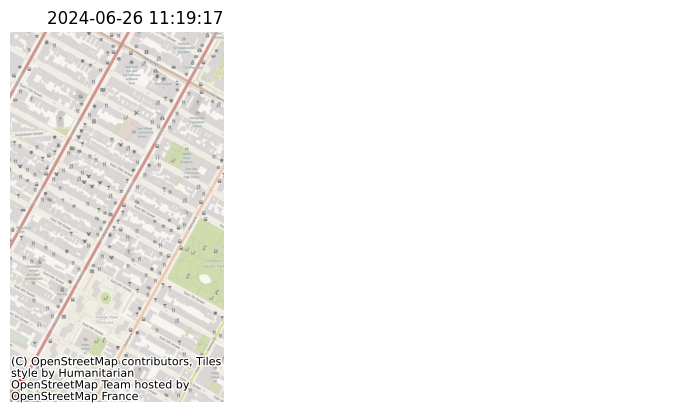

  0%|▎                                                                                 | 2/461 [00:00<03:29,  2.20it/s]

2024-06-26 11:19:18
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   
55753  1900-01-01 15:19:15   10      44.5 -0.854492 -0.122070  0.305176   

         acce_x    acce_y    acce_z           satellite  \
55737  0.950195  0.009277  0.313477 2024-06-26 11:19:01   
55744  0.946777  0.003906  0.317871 2024-06-26 11:19:01   
55753  0.949707  0.002930  0.327637 2024-06-26 11:19:15   

                               geometry  
55737  POINT (-8236362.182 4971613.357)  
55744  POINT (-8236362.182 4971613.357)  
55753  

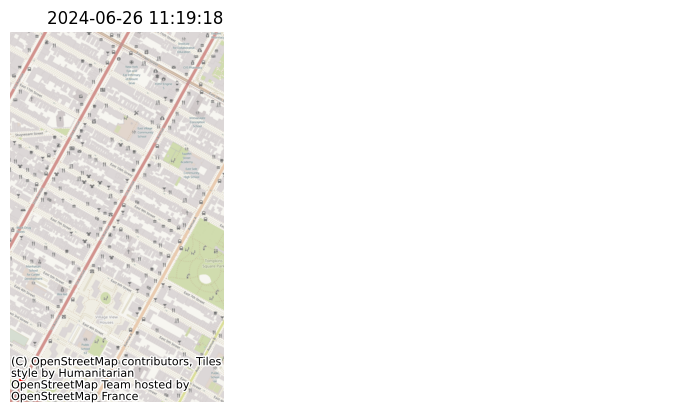

  1%|▌                                                                                 | 3/461 [00:01<03:28,  2.20it/s]

2024-06-26 11:19:19
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   
55753  1900-01-01 15:19:15   10      44.5 -0.854492 -0.122070  0.305176   
55762  1900-01-01 15:19:16   10      44.9 -0.549316 -0.183105  0.122070   

         acce_x    acce_y    acce_z           satellite  \
55737  0.950195  0.009277  0.313477 2024-06-26 11:19:01   
55744  0.946777  0.003906  0.317871 2024-06-26 11:19:01   
55753  0.949707  0.002930  0.327637 2024-

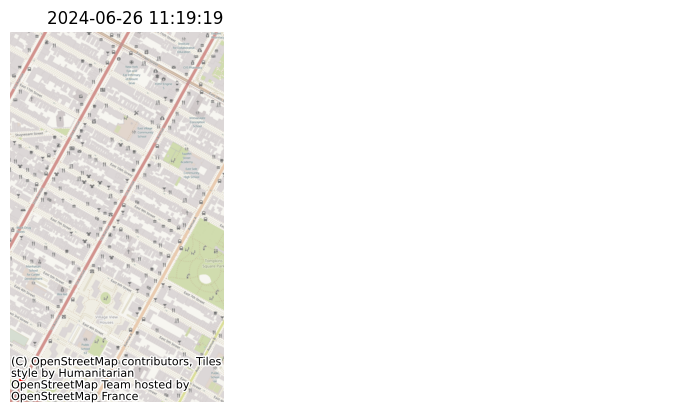

  1%|▋                                                                                 | 4/461 [00:01<03:29,  2.18it/s]

2024-06-26 11:19:20
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   
55753  1900-01-01 15:19:15   10      44.5 -0.854492 -0.122070  0.305176   
55762  1900-01-01 15:19:16   10      44.9 -0.549316 -0.183105  0.122070   
55773  1900-01-01 15:19:16   10      44.9 -0.671387 -0.244141 -0.427246   

         acce_x    acce_y    acce_z           satellite  \
55737  

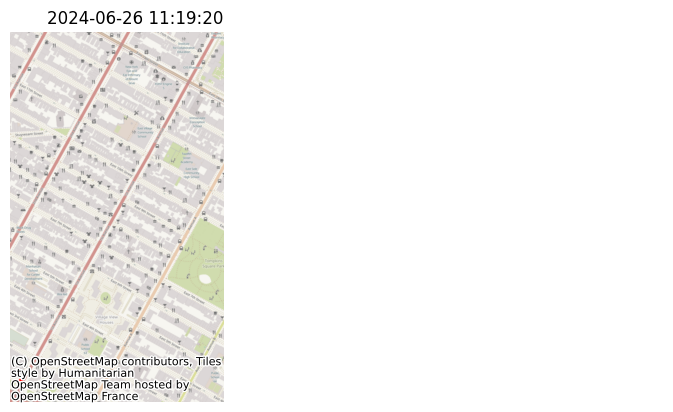

  1%|▉                                                                                 | 5/461 [00:02<03:29,  2.18it/s]

2024-06-26 11:19:21
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   
55753  1900-01-01 15:19:15   10      44.5 -0.854492 -0.122070  0.305176   
55762  1900-01-01 15:19:16   10      44.9 -0.549316 -0.183105  0.122070   
55773  1900-01-01 15:19:16   10      44.9 -0.671387 -0.244141 -0.

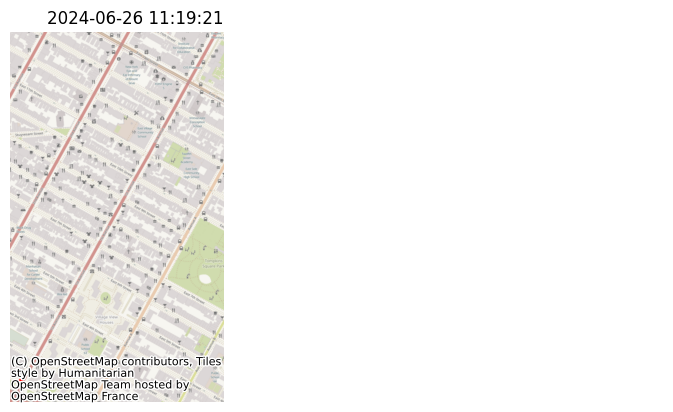

  1%|█                                                                                 | 6/461 [00:02<03:28,  2.18it/s]

2024-06-26 11:19:22
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   
55753  1900-01-01 15:19:15   10      44.5 -0.854492 -0.122070  0.305176   
55762  1900-01-01 15:19:16   10      44.9 -0.549316 -0.183105  

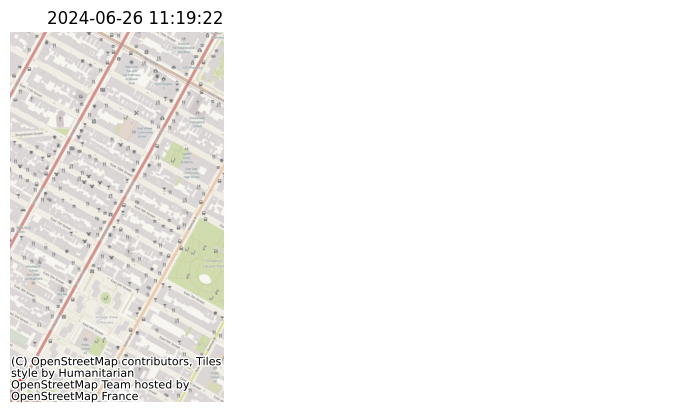

  2%|█▏                                                                                | 7/461 [00:03<03:27,  2.19it/s]

2024-06-26 11:19:23
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.183105 -0.244141   
55753  1900-01-01 15:19:15   10      44.5 -0.854492 -0.122070

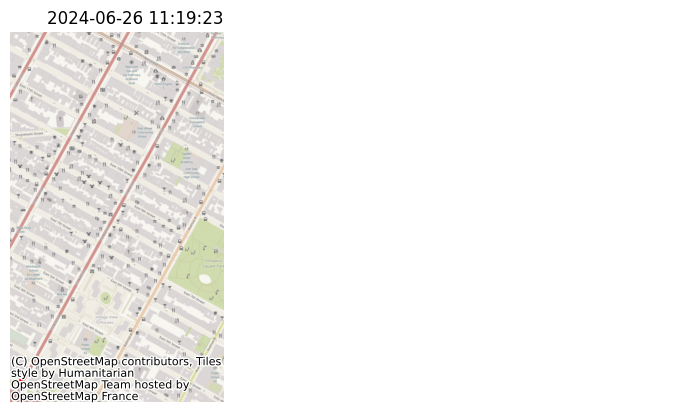

  2%|█▍                                                                                | 8/461 [00:03<03:26,  2.20it/s]

2024-06-26 11:19:24
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.061035  0.061035   
55744  1900-01-01 15:19:01   10      38.8 -1.403809  0.1831

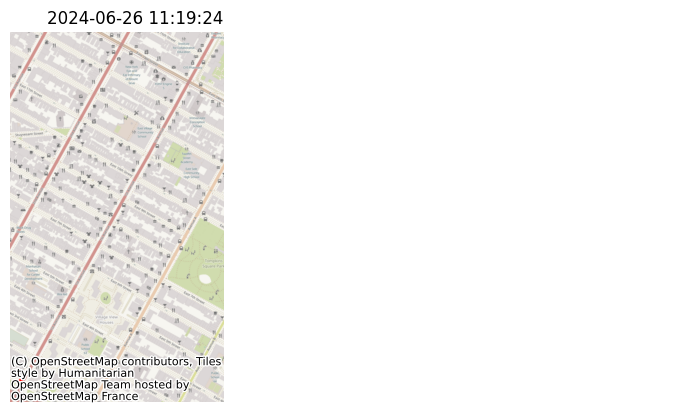

  2%|█▌                                                                                | 9/461 [00:04<03:25,  2.20it/s]

2024-06-26 11:19:25
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   

                   timeutc  fix  altitude    gyro_x    gyro_y    gyro_z  \
55737  1900-01-01 15:19:01   10      38.8 -1.220703 -0.06

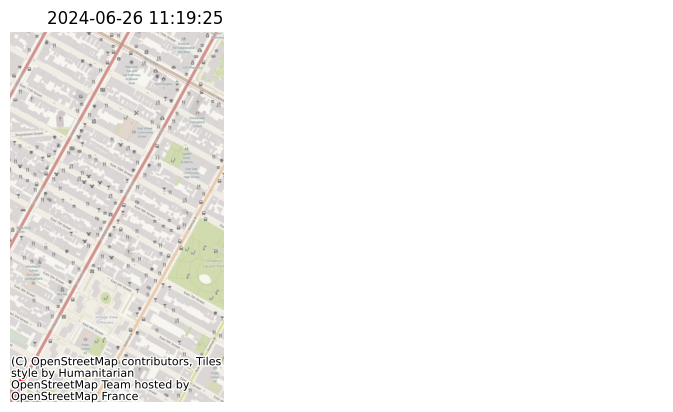

  2%|█▊                                                                               | 10/461 [00:04<03:24,  2.21it/s]

2024-06-26 11:19:26
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   

                   timeutc  fix  altitude    gyro_x    

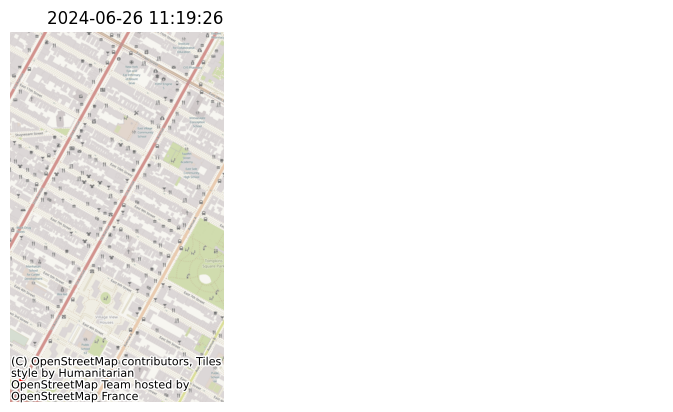

  2%|█▉                                                                               | 11/461 [00:05<03:24,  2.20it/s]

2024-06-26 11:19:27
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

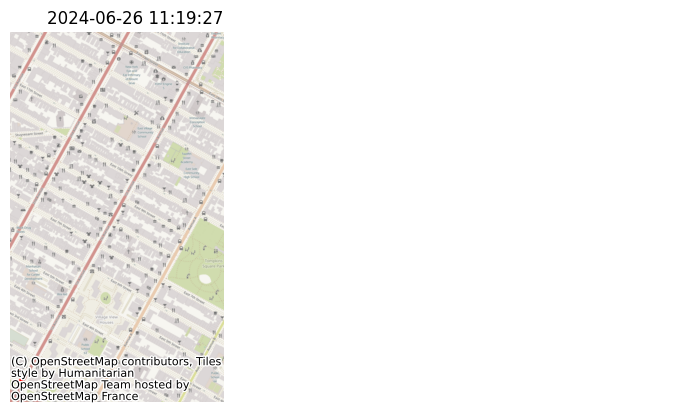

  3%|██                                                                               | 12/461 [00:05<03:23,  2.20it/s]

2024-06-26 11:19:28
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

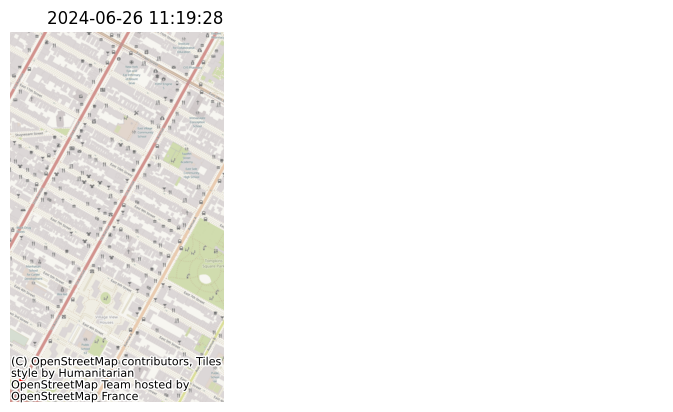

  3%|██▎                                                                              | 13/461 [00:05<03:23,  2.21it/s]

2024-06-26 11:19:29
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

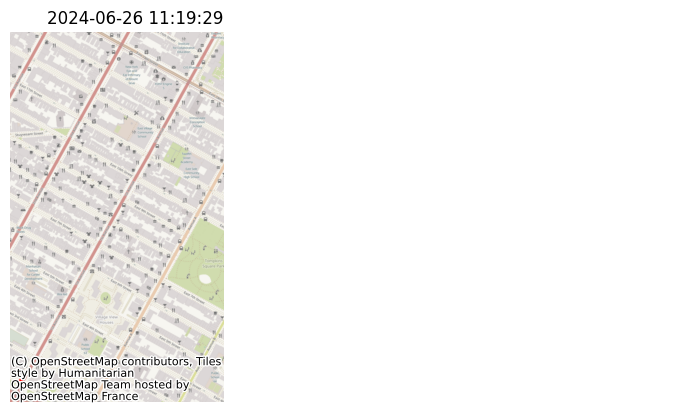

  3%|██▍                                                                              | 14/461 [00:06<03:22,  2.21it/s]

2024-06-26 11:19:30
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

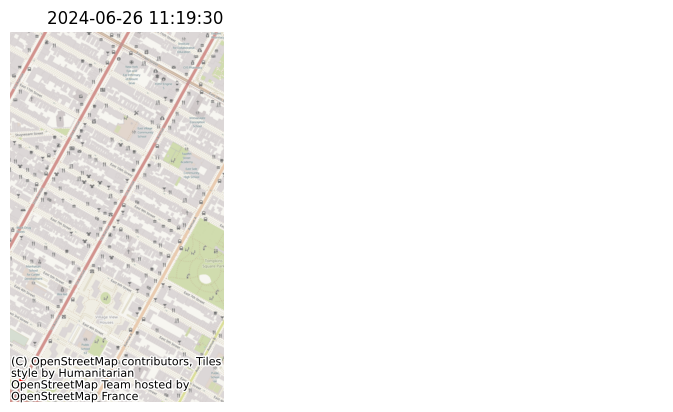

  3%|██▋                                                                              | 15/461 [00:06<03:22,  2.20it/s]

2024-06-26 11:19:31
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

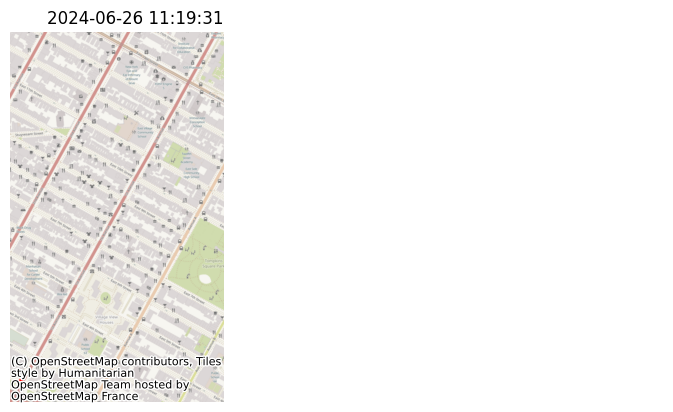

  3%|██▊                                                                              | 16/461 [00:07<03:22,  2.20it/s]

2024-06-26 11:19:32
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

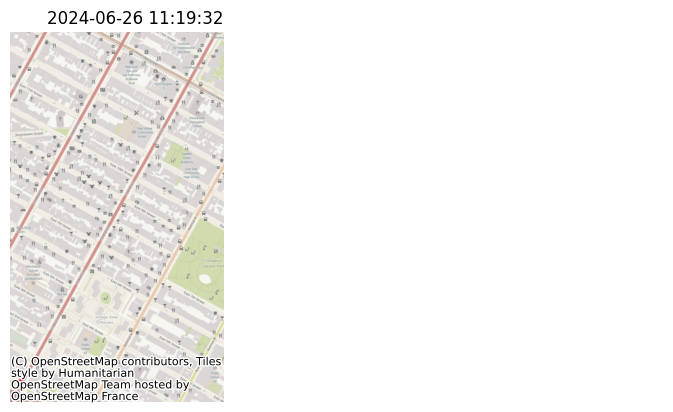

  4%|██▉                                                                              | 17/461 [00:07<03:21,  2.20it/s]

2024-06-26 11:19:33
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

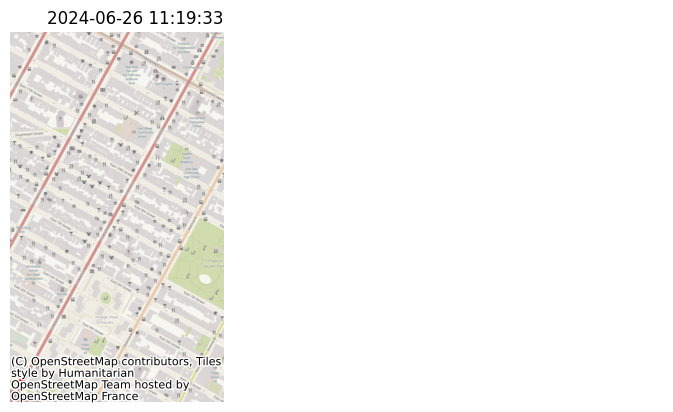

  4%|███▏                                                                             | 18/461 [00:08<03:22,  2.18it/s]

2024-06-26 11:19:34
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

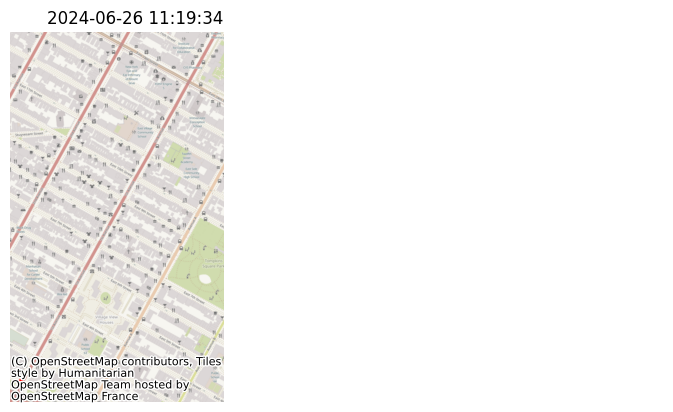

  4%|███▎                                                                             | 19/461 [00:08<03:21,  2.19it/s]

2024-06-26 11:19:35
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

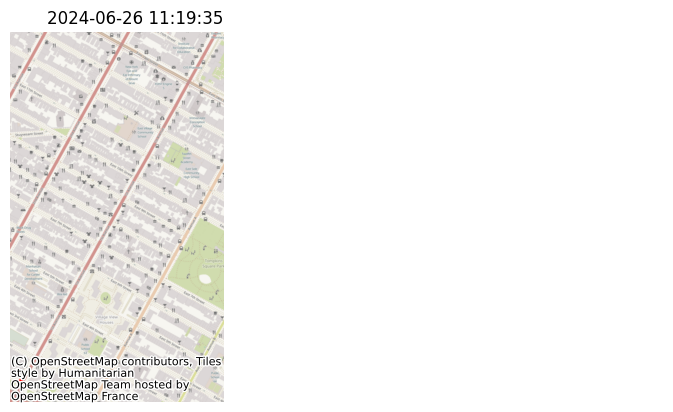

  4%|███▌                                                                             | 20/461 [00:09<03:20,  2.20it/s]

2024-06-26 11:19:36
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

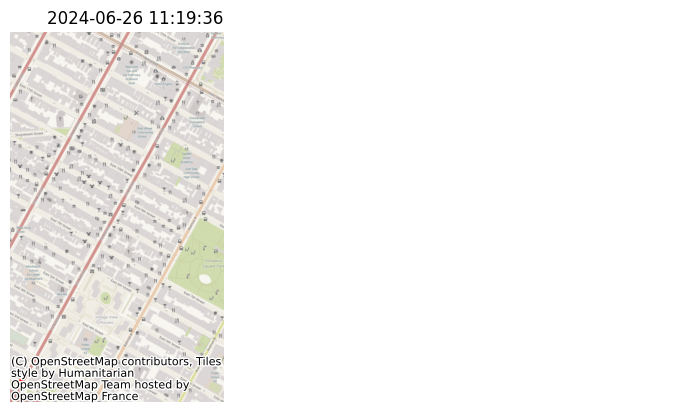

  5%|███▋                                                                             | 21/461 [00:09<03:19,  2.20it/s]

2024-06-26 11:19:37
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

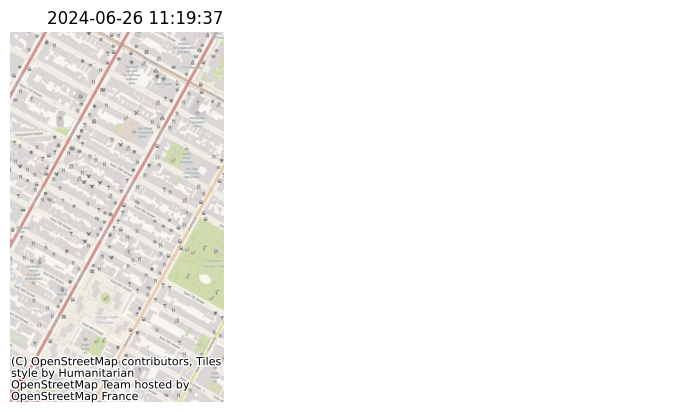

  5%|███▊                                                                             | 22/461 [00:10<03:19,  2.20it/s]

2024-06-26 11:19:38
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

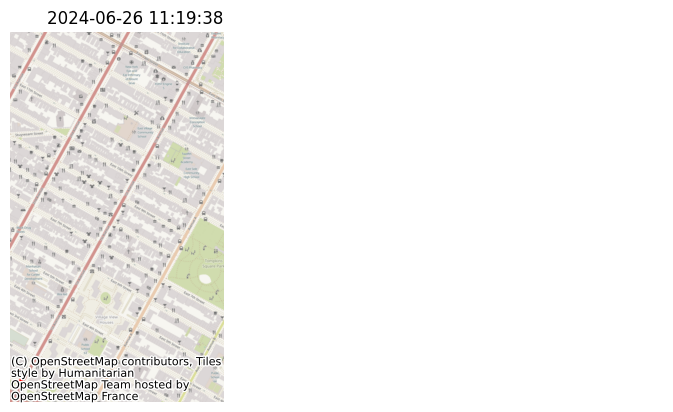

  5%|████                                                                             | 23/461 [00:10<03:18,  2.20it/s]

2024-06-26 11:19:39
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

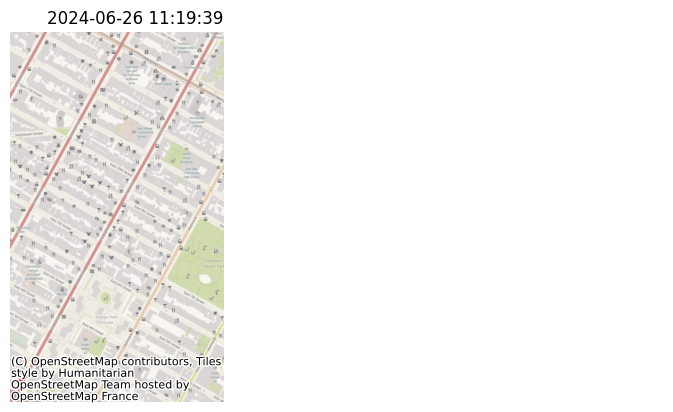

  5%|████▏                                                                            | 24/461 [00:10<03:18,  2.20it/s]

2024-06-26 11:19:40
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

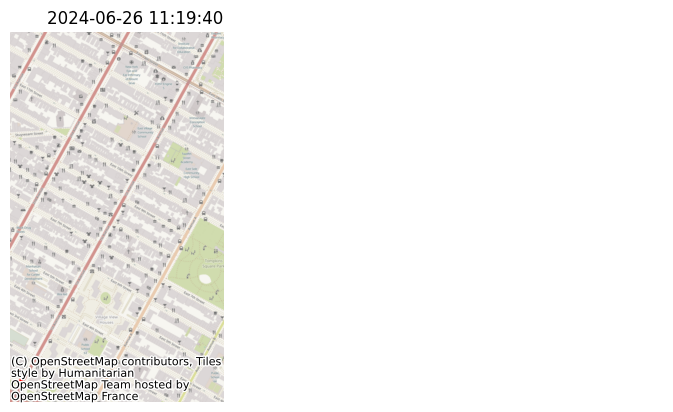

  5%|████▍                                                                            | 25/461 [00:11<03:18,  2.20it/s]

2024-06-26 11:19:41
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

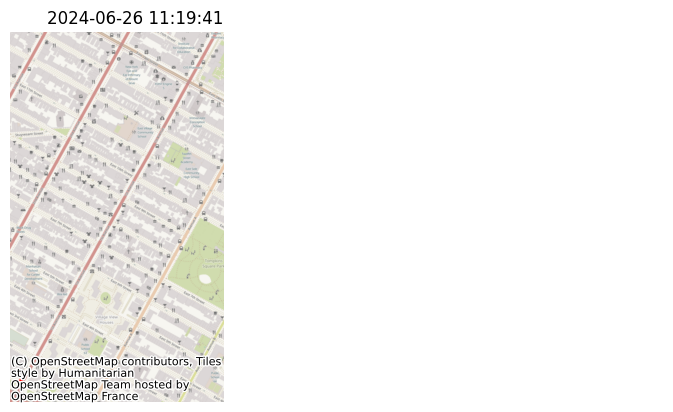

  6%|████▌                                                                            | 26/461 [00:12<03:47,  1.91it/s]

2024-06-26 11:19:42
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

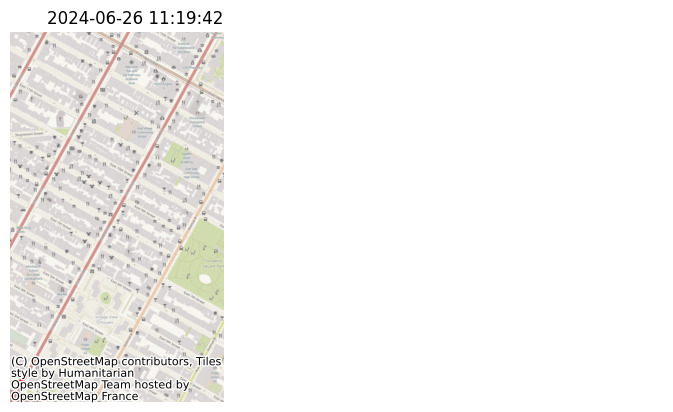

  6%|████▋                                                                            | 27/461 [00:12<03:37,  1.99it/s]

2024-06-26 11:19:43
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

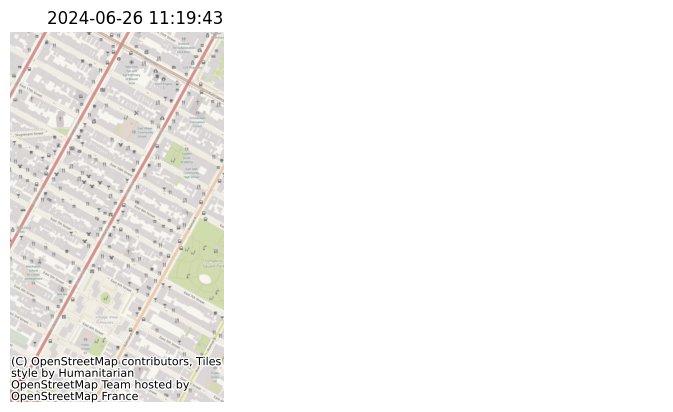

  6%|████▉                                                                            | 28/461 [00:12<03:31,  2.05it/s]

2024-06-26 11:19:44
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

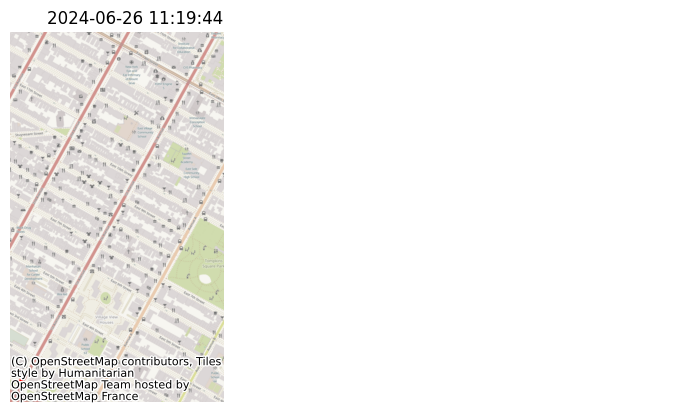

  6%|█████                                                                            | 29/461 [00:13<03:27,  2.09it/s]

2024-06-26 11:19:45
                     mac                        dtg   latitude  longitude  \
55737  d8:3a:dd:82:64:25 2024-06-26 11:19:16.253854  40.723297 -73.988500   
55744  d8:3a:dd:82:64:25 2024-06-26 11:19:17.004087  40.723297 -73.988500   
55753  d8:3a:dd:82:64:25 2024-06-26 11:19:18.038982  40.723278 -73.988498   
55762  d8:3a:dd:82:64:25 2024-06-26 11:19:19.006599  40.723277 -73.988497   
55773  d8:3a:dd:82:64:25 2024-06-26 11:19:20.025265  40.723277 -73.988497   
55784  d8:3a:dd:82:64:25 2024-06-26 11:19:21.017260  40.723275 -73.988498   
55794  d8:3a:dd:82:64:25 2024-06-26 11:19:21.977174  40.723275 -73.988497   
55805  d8:3a:dd:82:64:25 2024-06-26 11:19:22.973177  40.723275 -73.988497   
55816  d8:3a:dd:82:64:25 2024-06-26 11:19:23.965187  40.723274 -73.988497   
55826  d8:3a:dd:82:64:25 2024-06-26 11:19:25.023006  40.723274 -73.988497   
55836  d8:3a:dd:82:64:25 2024-06-26 11:19:25.997183  40.723273 -73.988496   
55847  d8:3a:dd:82:64:25 2024-06-26 11:19:27.009283  40.

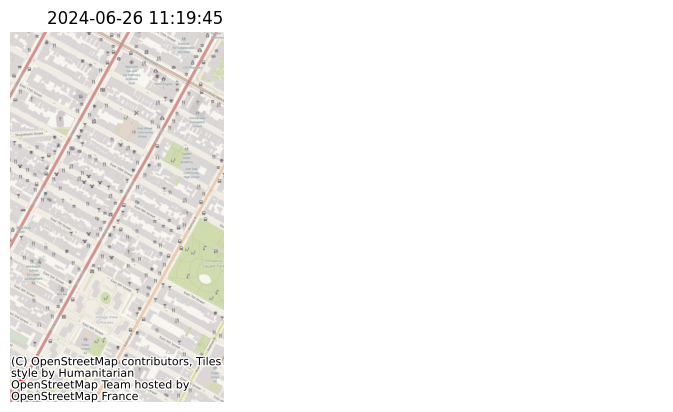

  7%|█████▎                                                                           | 30/461 [00:13<03:21,  2.14it/s]


2024-06-26 11:19:46


KeyboardInterrupt: 

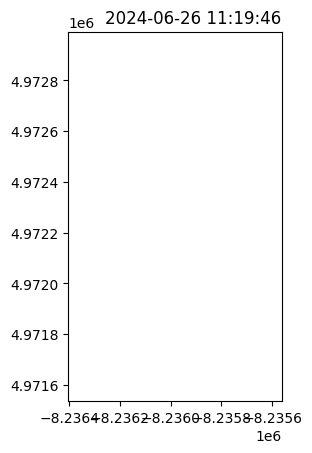

In [84]:
animate_gps(data, start, end, interval=1) # call animate_gps function to generate a gif to visualize GPS; can be slow if too many data is loaded